# Supervised Regression with Multiple Variables
<hr>

## 0. Import library
<ht>

In [1]:
# Import libraries

# math library
import numpy as np

# visualization library
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png2x','pdf')
import matplotlib.pyplot as plt

# machine learning library
from sklearn.linear_model import LinearRegression

# 3d visualization
from mpl_toolkits.mplot3d import axes3d

# computational time
import time

## 1. Load dataset
<hr>

Load a set of data points $\{ (x_i, y_i, z_i) \}_{i=1}^n$ where $x_i$ and $y_i$ are considered as an input and $z_i$ is considered as an output for $i$-th data point.

In [13]:
# import data with numpy
data_clean = np.genfromtxt('data_clean.txt', delimiter=',')
data_noisy = np.genfromtxt('data_noisy.txt', delimiter=',')

data_clean = data_clean[:,0:3]  # do not change it
data_noisy = data_noisy[:,0:3]  # do not change it

# number of training data
n_clean = len(data_clean)
n_noisy = len(data_noisy)

## 2. Explore the dataset distribution
<hr>

Plot the training data points in 3D cartesian coordinate system.
(You may use matplotlib function `scatter3D()`.)

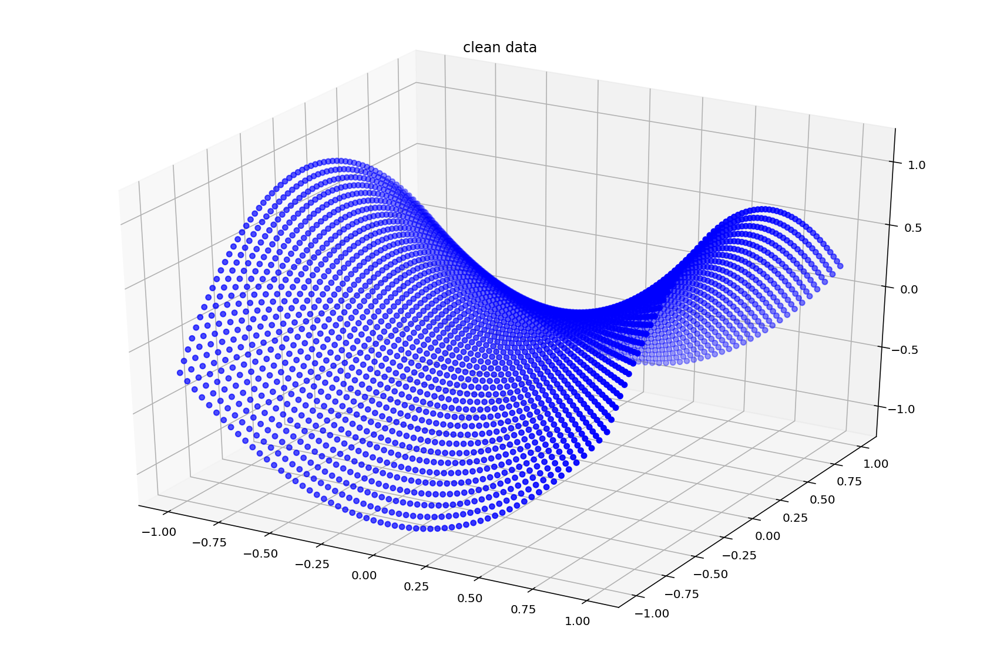

In [14]:
x_clean = data_clean[:,0]
y_clean = data_clean[:,1]
z_clean = data_clean[:,2]
fig = plt.figure(figsize=(15,10))
ax1 = fig.add_subplot(projection='3d')
ax1.set_title('clean data')
ax1.scatter3D(x_clean, y_clean, z_clean, c='b')

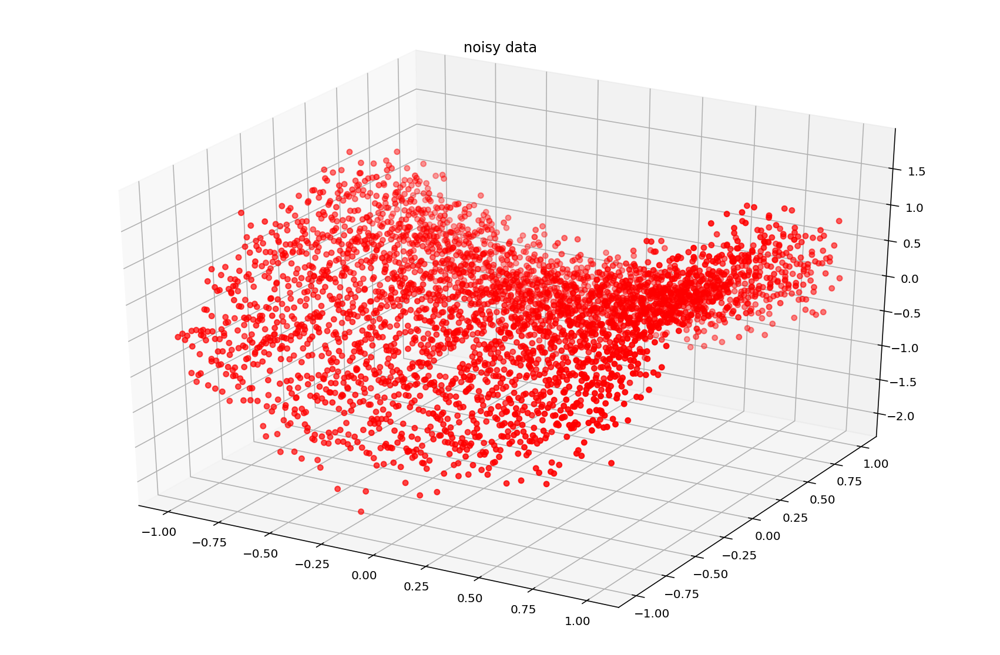

In [15]:
x_train = data_noisy[:,0]
y_train = data_noisy[:,1]
z_train = data_noisy[:,2]
fig = plt.figure(figsize=(15,10))
ax2 = fig.add_subplot(projection='3d')
ax2.set_title('noisy data')
ax2.scatter3D(x_train, y_train, z_train, c='r')

## 3. Define the prediction function 
<hr>
$$
f_w(x, y) = w_0 f_0(x, y) + w_1 f_1(x, y) + w_2 f_2(x, y) + w_3 f_3(x, y) + w_4 f_4(x, y) + w_5 f_5(x, y) + w_6 f_6(x, y) + w_7 f_7(x, y) + w_8 f_8(x, y) + w_9 f_9(x, y)
$$

where feature function $f$ is defined as follows:

$$
\begin{align*}
    f_0(x, y) &= \\
    f_1(x, y) &= \\
    f_2(x, y) &= \\
    f_3(x, y) &= \\
    f_4(x, y) &= \\
    f_5(x, y) &= \\
    f_6(x, y) &= \\
    f_7(x, y) &= \\
    f_8(x, y) &= \\
    f_9(x, y) &= 
\end{align*}
$$

### Vectorized implementation:

$$
f_w(x) = X w 
$$
with 
<br>
$$
X = 
\left[ 
\begin{array}{cccc}
f_0(x_1, y_1) & f_1(x_1, y_1) & f_2(x_1, y_1) & f_3(x_1, y_1) & f_4(x_1, y_1) & f_5(x_1, y_1) & f_6(x_1, y_1) & f_7(x_1, y_1) & f_8(x_1, y_1) & f_9(x_1, y_1) \\
f_0(x_2, y_2) & f_1(x_2, y_2) & f_2(x_2, y_2) & f_3(x_2, y_2) & f_4(x_2, y_2) & f_5(x_2, y_2) & f_6(x_2, y_2) & f_7(x_2, y_2) & f_8(x_2, y_2) & f_9(x_2, y_2) \\
\vdots\\
f_0(x_n, y_n) & f_1(x_n, y_n) & f_2(x_n, y_n) & f_3(x_n, y_n) & f_4(x_n, y_n) & f_5(x_n, y_n) & f_6(x_n, y_n) & f_7(x_n, y_n) & f_8(x_n, y_n) & f_9(x_n, y_n)
\end{array} 
\right]
\quad
\textrm{ and }
\quad
w = 
\left[ 
\begin{array}{cccc}
w_0 \\ 
w_1 \\
w_2 \\ 
w_3 \\ 
w_4 \\ 
w_5 \\
w_6 \\
w_7 \\
w_8 \\
w_9
\end{array} 
\right]
$$

Implement the vectorized version of the predictive function. <br>

In [62]:
# construct data matrix

n = data_noisy.shape[0]
X = np.ones([n,10]) 

X[:,1] = data_noisy[:,0]
X[:,2] = data_noisy[:,1]
X[:,3] = 0
X[:,4] = 0
X[:,5] = 0
X[:,6] = 0
X[:,7] = 0
X[:,8] = 0
X[:,9] = 0

print(X.shape)

# parameters vector
w = np.array([1,1,1,1,1,1,1,1,1,1])[:,None] # [:,None] adds a singleton dimension
# predictive function definition
def f_pred(X,w): 
    
    f = np.matmul(X,w)
    
    return f 

# Test predicitive function 
z_pred = f_pred(X,w)

(3600, 10)


## 4. Define the regression loss 
<hr>
$$
L(w)=\frac{1}{n} \sum_{i=1}^n \ \Big( f_w(x_i, y_i) – z_i \Big)^2
$$

### Vectorized implementation:

$$
L(w)=\frac{1}{n} (Xw-z)^T(Xw-z)
$$
with 
<br>
$$
Xw=
\left[ 
\begin{array}{cccc}
f_w(x_1, y_1) \\ 
f_w(x_2, y_2) \\ 
\vdots\\
f_w(x_n, y_n) \\ 
\end{array} 
\right]
\quad
\textrm{ and }
\quad
z = 
\left[ 
\begin{array}{cccc}
z_1 \\ 
z_2 \\ 
\vdots\\
z_n
\end{array} 
\right]
$$

Implement the vectorized version of the regression loss function. <br>


In [77]:
# loss function definition
def loss_mse(z_pred,z): 
    loss = np.mean(np.power(z_pred-z,2))
    
    return loss


# Test loss function 
z = data_noisy[:,2][:,None]# label
z_pred = f_pred(X,w)# prediction
loss = loss_mse(z_pred,z)
loss

0.27127689482278144

## 5. Define the gradient of the regression loss 
<hr>

$\bullet$ Vectorized implementation: Given the loss

$$
L(w)=\frac{1}{n} (Xw-z)^T(Xw-z)
$$

The gradient is given by  

$$
\frac{\partial}{\partial w} L(w) = \frac{2}{n} X^T(Xw-z)
$$


Implement the vectorized version of the gradient of the regression loss function.

In [64]:
# gradient function definition
def grad_loss(z_pred,z,X):
    grad = np.matmul(X.T, (z_pred-z)) * 2 / len(X)
    
    return grad


# Test grad function 
z_pred = f_pred(X,w)
grad = grad_loss(z_pred,z,X)
grad

array([[2.00724894],
       [0.6351953 ],
       [0.64383324],
       [0.        ],
       [0.        ],
       [0.        ],
       [0.        ],
       [0.        ],
       [0.        ],
       [0.        ]])

## 6. Implement the gradient descent algorithm 
<hr>

### Vectorized implementation: 

$$
w^{k+1} = w^{k} - \tau  \frac{2}{n} X^T(Xw^{k}-z)
$$

Implement the vectorized version of the gradient descent function.

Plot the loss values $L(w^k)$ with respect to iteration $k$ the number of iterations.

Time= 0.24534201622009277
0.2712768948722709
[[-0.00362447]
 [ 0.07832461]
 [ 0.06580435]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]
 [ 0.        ]]


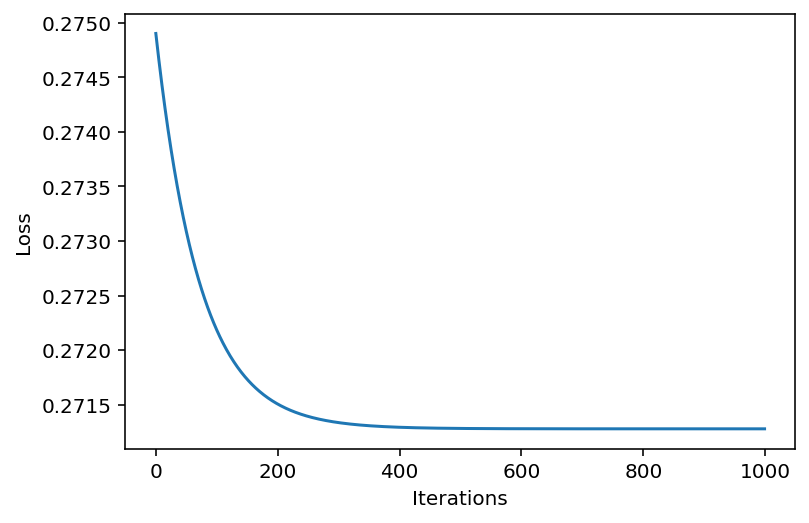

In [65]:
# gradient descent function definition
def grad_desc(X, z , w_init=np.array([0,0])[:,None] ,tau=0.01, max_iter=500):

    L_iters = np.zeros([max_iter]) # record the loss values
    w_iters = np.zeros([max_iter,w_init.shape[0]]) # record the loss values
    w = w_init # initialization
    
    for i in range(max_iter): # loop over the iterations
        z_pred = f_pred(X, w)# linear predicition function 
        grad_f = grad_loss(z_pred, z, X)# gradient of the loss 
        w = w - tau * grad_f# update rule of gradient descent
        L_iters[i] = loss_mse(z_pred, z) # save the current loss value 
        w_iters[i,:] = w.T# save the current w value 
        
    return w, L_iters, w_iters


# run gradient descent algorithm 
start = time.time()
w_init = np.zeros([10,1])
tau = 0.01
max_iter = 1000

w, L_iters, w_iters = grad_desc(X,z,w_init,tau,max_iter)

print('Time=',time.time() - start) # plot the computational cost
print(L_iters[-1]) # plot the last value of the loss
print(w) # plot the last value of the parameter w 


# plot
plt.figure(2)
plt.plot(np.arange(max_iter), L_iters) # plot the loss curve
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

## 7. Plot the prediction function
<hr>
$$
f_w(x, y) = w_0 f_0(x, y) + w_1 f_1(x, y) + w_2 f_2(x, y) + w_3 f_3(x, y) + w_4 f_4(x, y) + w_5 f_5(x, y) + w_6 f_6(x, y) + w_7 f_7(x, y) + w_8 f_8(x, y) + w_9 f_9(x, y)
$$

(You may use numpy function `meshgrid` and `plot_surface` for plot the linear prediction function.)

## 8. Plot the prediction function superimposed on the training data
<hr>

(-1.0500948081943482, 1.0630000973850522)

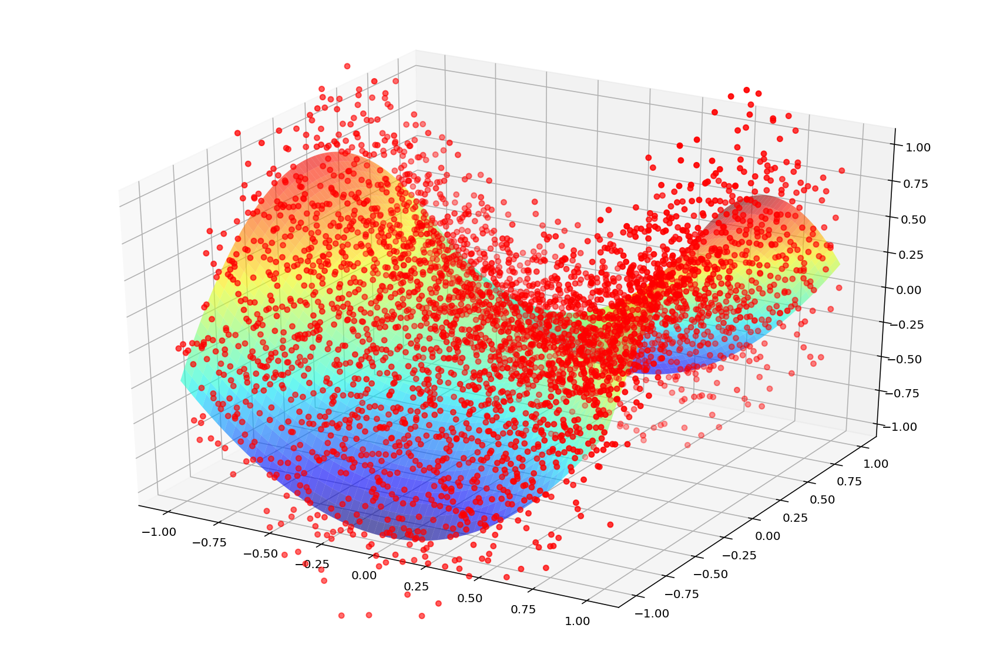

In [116]:
x_coordinate = np.linspace(-1, 1, 60) 
y_coordinate = np.linspace(-1, 1, 60) 

x_pred, y_pred = np.meshgrid(x_coordinate, y_coordinate, indexing='xy')
z_pred = np.zeros((x_coordinate.size, y_coordinate.size))
for (i,j),v in np.ndenumerate(z_pred):
    X = np.zeros([1,10])
    X[0,1] = x_coordinate[j]
    X[0,2] = np.power(x_coordinate[j],2)
    X[0,3] = np.power(x_coordinate[j],3)
    X[0,4] = y_coordinate[i]
    X[0,5] = np.power(y_coordinate[i],2)
    X[0,6] = np.power(y_coordinate[i],3)
    X[0,7] = x_coordinate[j] * y_coordinate[i]
    X[0,8] = np.power(x_coordinate[j],2) * y_coordinate[i]
    X[0,9] = np.power(y_coordinate[i],2) * x_coordinate[j]
    z_pred[i][j] = f_pred(X, w)

# plot
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.plot_surface(x_pred, y_pred, z_pred, rstride=1, cstride=1, alpha=0.6, cmap=plt.cm.jet)
ax.scatter3D(x_train, y_train, z_train, c='r')
ax.set_zlim(z_pred.min(),z_pred.max())

# Output results

## 1. Plot the clean data in 3D cartesian coordinate system (1pt)

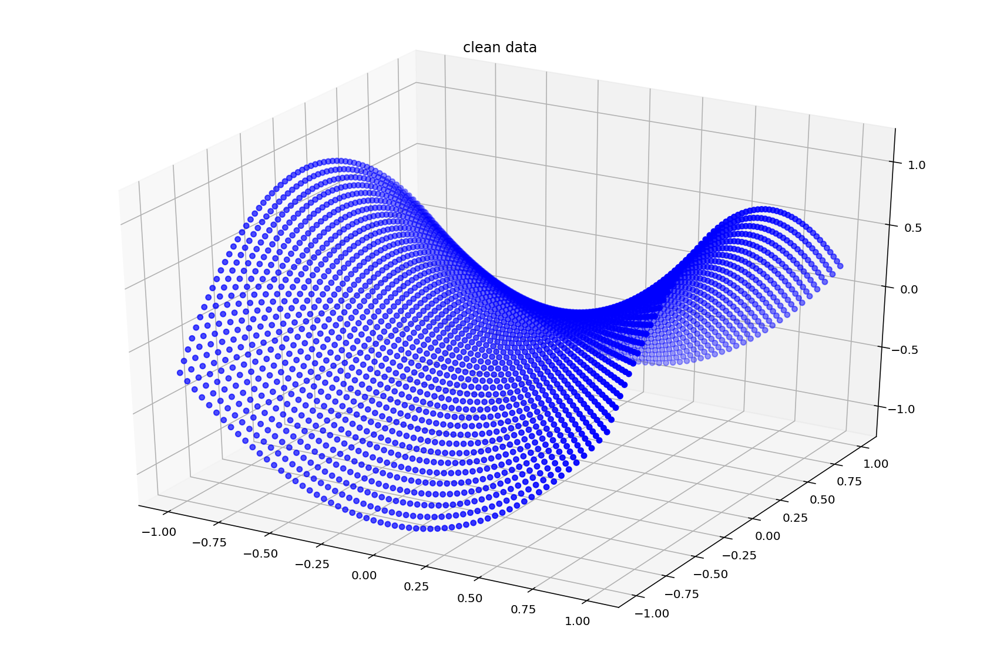

In [2]:
# import data with numpy
data_clean = np.genfromtxt('data_clean.txt', delimiter=',')
data_noisy = np.genfromtxt('data_noisy.txt', delimiter=',')

data_clean = data_clean[:,0:3]  # do not change it
data_noisy = data_noisy[:,0:3]  # do not change it

# number of training data
n_clean = len(data_clean)
n_noisy = len(data_noisy)
x_clean = data_clean[:,0]
y_clean = data_clean[:,1]
z_clean = data_clean[:,2]
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(projection='3d')
ax.set_title('clean data')
ax.scatter3D(x_clean, y_clean, z_clean,c ='b')

## 2. Plot the noisy data in 3D cartesian coordinate system (1pt)

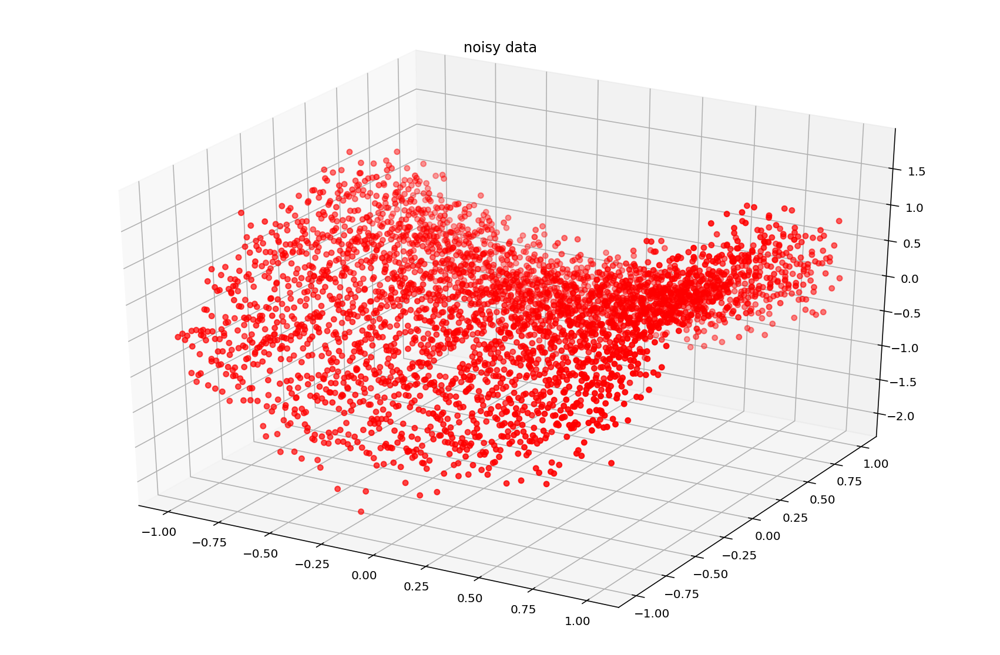

In [3]:
# import data with numpy
data_noisy = np.genfromtxt('data_noisy.txt', delimiter=',')

data_noisy = data_noisy[:,0:3]  # do not change it

# number of training data
n_noisy = len(data_noisy)
x_train = data_noisy[:,0]
y_train = data_noisy[:,1]
z_train = data_noisy[:,2]
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(projection='3d')
ax.set_title('noisy data')
ax.scatter3D(x_train, y_train, z_train, c='r')

## 3. Plot the loss curve in the course of gradient descent (2pt)

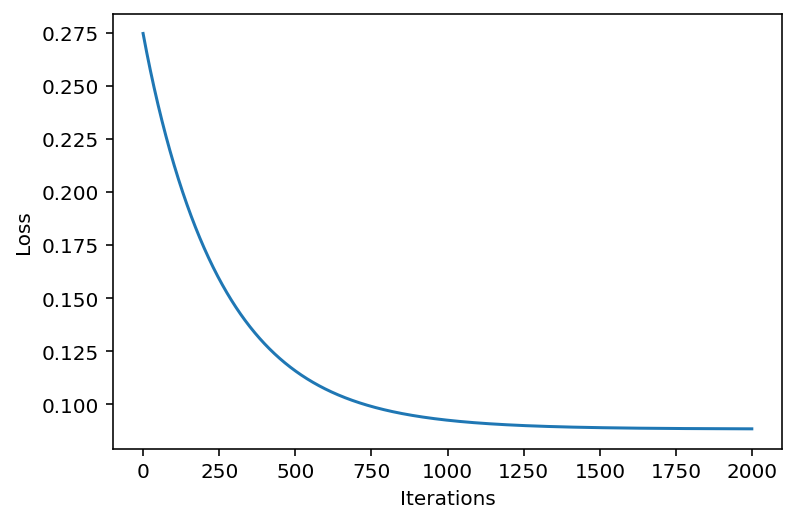

In [3]:
def f_pred(X,w): 
    
    f = np.matmul(X,w)
    
    return f 
def loss_mse(z_pred,z): 
    loss = np.mean(np.power(z_pred-z,2))
    
    return loss
def grad_loss(z_pred,z,X):
    grad = np.matmul(X.T, (z_pred-z)) * 2 / len(X)
    
    return grad

# gradient descent function definition
def grad_desc(X, z , w_init=np.array([0,0])[:,None] ,tau=0.01, max_iter=500):

    L_iters = np.zeros([max_iter]) # record the loss values
    w_iters = np.zeros([max_iter,w_init.shape[0]]) # record the loss values
    w = w_init # initialization
    
    for i in range(max_iter): # loop over the iterations
        z_pred = f_pred(X, w)# linear predicition function 
        grad_f = grad_loss(z_pred, z, X)# gradient of the loss 
        w = w - tau * grad_f# update rule of gradient descent
        L_iters[i] = loss_mse(z_pred, z) # save the current loss value 
        w_iters[i,:] = w.T# save the current w value 
        
    return w, L_iters, w_iters

def make_X(x,y,n) :
    n = len(x)
    X = np.ones([n,10])
    X[:,1] = x
    X[:,2] = np.power(x,2)
    X[:,3] = np.power(x,3)
    X[:,4] = y
    X[:,5] = np.power(y,2)
    X[:,6] = np.power(y,3)
    X[:,7] = x * y
    X[:,8] = np.power(x,2) * y
    X[:,9] = np.power(y,2) * x
    return X

data_noisy = np.genfromtxt('data_noisy.txt', delimiter=',')
data_noisy = data_noisy[:,0:3]  # do not change it
z = data_noisy[:,2][:,None]
n = len(data_noisy)
X = make_X(data_noisy[:,0], data_noisy[:,1], len(data_noisy))


# run gradient descent algorithm 
start = time.time()
w_init = np.zeros([X.shape[1],1])
tau = 0.01
max_iter = 2000

w, L_iters, w_iters = grad_desc(X,z,w_init,tau,max_iter)

# plot
plt.figure(2)
plt.plot(np.arange(max_iter), L_iters) # plot the loss curve
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

## 4. Print out the final loss value at convergence of the gradient descent (1pt)

In [125]:
def f_pred(X,w): 
    
    f = np.matmul(X,w)
    
    return f 
def loss_mse(z_pred,z): 
    loss = np.mean(np.power(z_pred-z,2))
    
    return loss
def grad_loss(z_pred,z,X):
    grad = np.matmul(X.T, (z_pred-z)) * 2 / len(X)
    
    return grad

# gradient descent function definition
def grad_desc(X, z , w_init=np.array([0,0])[:,None] ,tau=0.01, max_iter=500):

    L_iters = np.zeros([max_iter]) # record the loss values
    w_iters = np.zeros([max_iter,w_init.shape[0]]) # record the loss values
    w = w_init # initialization
    
    for i in range(max_iter): # loop over the iterations
        z_pred = f_pred(X, w)# linear predicition function 
        grad_f = grad_loss(z_pred, z, X)# gradient of the loss 
        w = w - tau * grad_f# update rule of gradient descent
        L_iters[i] = loss_mse(z_pred, z) # save the current loss value 
        w_iters[i,:] = w.T# save the current w value 
        
    return w, L_iters, w_iters

def make_X(x,y,n) :
    n = len(x)
    X = np.ones([n,10])
    X[:,1] = x
    X[:,2] = np.power(x,2)
    X[:,3] = np.power(x,3)
    X[:,4] = y
    X[:,5] = np.power(y,2)
    X[:,6] = np.power(y,3)
    X[:,7] = x * y
    X[:,8] = np.power(x,2) * y
    X[:,9] = np.power(y,2) * x
    return X

data_noisy = np.genfromtxt('data_noisy.txt', delimiter=',')
data_noisy = data_noisy[:,0:3]  # do not change it
z = data_noisy[:,2][:,None]
X = make_X(data_noisy[:,0], data_noisy[:,1], len(data_noisy))
# run gradient descent algorithm 
start = time.time()
w_init = np.zeros([X.shape[1],1])
tau = 0.01
max_iter = 2000

w, L_iters, w_iters = grad_desc(X,z,w_init,tau,max_iter)

print('loss at convergence =', L_iters[-1])

loss at convergence = 0.08844926700370863


## 5. Print out the final model parameter values at convergence of the gradient descent (1pt)

In [5]:
def f_pred(X,w): 
    
    f = np.matmul(X,w)
    
    return f 
def loss_mse(z_pred,z): 
    loss = np.mean(np.power(z_pred-z,2))
    
    return loss
def grad_loss(z_pred,z,X):
    grad = np.matmul(X.T, (z_pred-z)) * 2 / len(X)
    
    return grad

# gradient descent function definition
def grad_desc(X, z , w_init=np.array([0,0])[:,None] ,tau=0.01, max_iter=500):

    L_iters = np.zeros([max_iter]) # record the loss values
    w_iters = np.zeros([max_iter,w_init.shape[0]]) # record the loss values
    w = w_init # initialization
    
    for i in range(max_iter): # loop over the iterations
        z_pred = f_pred(X, w)# linear predicition function 
        grad_f = grad_loss(z_pred, z, X)# gradient of the loss 
        w = w - tau * grad_f# update rule of gradient descent
        L_iters[i] = loss_mse(z_pred, z) # save the current loss value 
        w_iters[i,:] = w.T# save the current w value 
        
    return w, L_iters, w_iters

def make_X(x,y,n) :
    X = np.ones([n,10])
    X[:,1] = x
    X[:,2] = np.power(x,2)
    X[:,3] = np.power(x,3)
    X[:,4] = y
    X[:,5] = np.power(y,2)
    X[:,6] = np.power(y,3)
    X[:,7] = x * y
    X[:,8] = np.power(x,2) * y
    X[:,9] = np.power(y,2) * x
    return X

data_noisy = np.genfromtxt('data_noisy.txt', delimiter=',')
data_noisy = data_noisy[:,0:3]  # do not change it
z = data_noisy[:,2][:,None]
X = make_X(data_noisy[:,0], data_noisy[:,1], len(data_noisy))
# run gradient descent algorithm 
start = time.time()
w_init = np.zeros([X.shape[1],1])
tau = 0.01
max_iter = 2000

w, L_iters, w_iters = grad_desc(X,z,w_init,tau,max_iter)
for i, parameter in enumerate(w_iters[-1]) :
    print('model parameter: w_{} = {}'.format(i, parameter))

model parameter: w_0 = -0.008056154663605933
model parameter: w_1 = 0.03971146634237408
model parameter: w_2 = 0.9645537503064733
model parameter: w_3 = 0.06691864718759417
model parameter: w_4 = 0.014278403350749168
model parameter: w_5 = -0.9516321426398581
model parameter: w_6 = 0.07542224011016849
model parameter: w_7 = -0.011695397855446116
model parameter: w_8 = 0.01854563854962801
model parameter: w_9 = -0.006190989981600556


## 6. Plot the prediction function in 3D cartesian coordinate system (2pt)

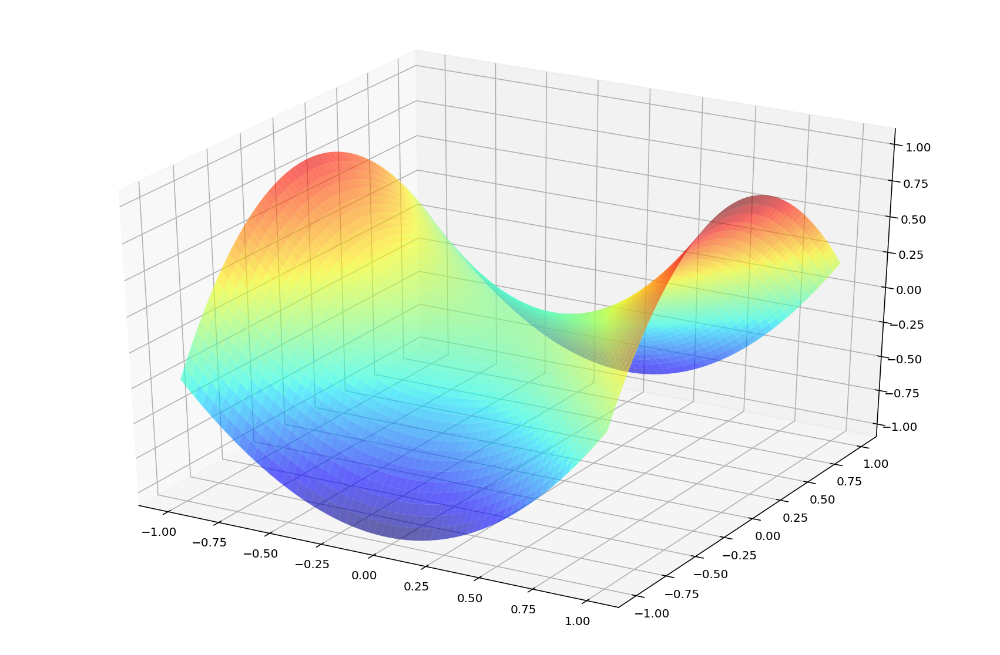

In [4]:
def f_pred(X,w): 
    
    f = np.matmul(X,w)
    
    return f 

def make_X(x,y, n) :
    X = np.ones([n,10])
    X[:,1] = x
    X[:,2] = np.power(x,2)
    X[:,3] = np.power(x,3)
    X[:,4] = y
    X[:,5] = np.power(y,2)
    X[:,6] = np.power(y,3)
    X[:,7] = x * y
    X[:,8] = np.power(x,2) * y
    X[:,9] = np.power(y,2) * x
    return X

x_coordinate = np.linspace(-1, 1, 60) 
y_coordinate = np.linspace(-1, 1, 60) 

x_pred, y_pred = np.meshgrid(x_coordinate, y_coordinate, indexing='xy')
z_pred = np.zeros((x_coordinate.size, y_coordinate.size))

w = [[-0.00805615],[ 0.03971147],[ 0.96455375],[ 0.06691865],[ 0.0142784 ],[-0.95163214],[ 0.07542224],[-0.0116954 ],[ 0.01854564],[-0.00619099]]

for (i,j),v in np.ndenumerate(z_pred):
    X = make_X(x_coordinate[j],y_coordinate[i], 1)
    z_pred[i][j] = f_pred(X, w)

# plot
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.plot_surface(x_pred, y_pred, z_pred, rstride=1, cstride=1, alpha=0.6, cmap=plt.cm.jet)
ax.set_zlim(z_pred.min(),z_pred.max())
plt.show()

## 7. Plot the prediction functions superimposed on the training data (2pt)

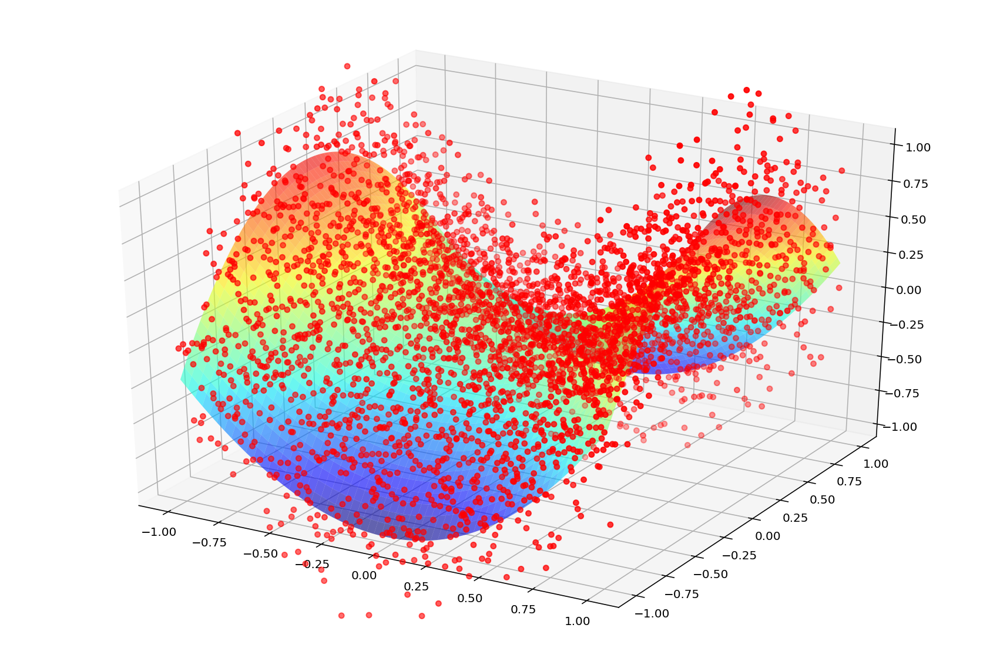

In [20]:
def f_pred(X,w): 
    
    f = np.matmul(X,w)
    
    return f 

def make_X(x,y, n) :
    X = np.ones([n,10])
    X[:,1] = x
    X[:,2] = np.power(x,2)
    X[:,3] = np.power(x,3)
    X[:,4] = y
    X[:,5] = np.power(y,2)
    X[:,6] = np.power(y,3)
    X[:,7] = x * y
    X[:,8] = np.power(x,2) * y
    X[:,9] = np.power(y,2) * x
    return X
data_noisy = np.genfromtxt('data_noisy.txt', delimiter=',')
data_noisy = data_noisy[:,0:3]  # do not change it

x_coordinate = np.linspace(-1, 1, 60) 
y_coordinate = np.linspace(-1, 1, 60) 

x_pred, y_pred = np.meshgrid(x_coordinate, y_coordinate, indexing='xy')
z_pred = np.zeros((x_coordinate.size, y_coordinate.size))

w = [[-0.00805615],[ 0.03971147],[ 0.96455375],[ 0.06691865],[ 0.0142784 ],[-0.95163214],[ 0.07542224],[-0.0116954 ],[ 0.01854564],[-0.00619099]]

for (i,j),v in np.ndenumerate(z_pred):
    X = make_X(x_coordinate[j],y_coordinate[i], 1)
    z_pred[i][j] = f_pred(X, w)

# plot
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.plot_surface(x_pred, y_pred, z_pred, rstride=1, cstride=1, alpha=0.6, cmap=plt.cm.jet)
ax.scatter3D(data_noisy[:,0], data_noisy[:,1], data_noisy[:,2], c='r')
ax.set_zlim(z_pred.min(),z_pred.max())
plt.show()